<a href="https://colab.research.google.com/github/aryalkoshish/big_data/blob/main/Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
df_anime = pd.read_csv('anime/anime-dataset-2023.csv')
df_user_details =  pd.read_csv('anime/users-details-2023.csv')
df_user_score = pd.read_csv('anime/users-score-2023.csv')

In [ ]:
genre_counts = df_anime['Genres'].str.split(', ').explode().value_counts()
print(genre_counts)

Comedy           7142
Fantasy          5306
UNKNOWN          4929
Action           4730
Adventure        3842
Sci-Fi           3091
Drama            2836
Romance          2063
Slice of Life    1755
Supernatural     1494
Hentai           1486
Mystery           847
Avant Garde       804
Ecchi             795
Sports            771
Horror            534
Suspense          242
Award Winning     241
Boys Love         169
Gourmet           146
Girls Love        113
Erotica            54
Name: Genres, dtype: int64


In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df_anime, title='Pandas Profiling Report', explorative=True)
profile.to_widgets()
profile.to_file("report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_user_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731290 entries, 0 to 731289
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Mal ID            731290 non-null  int64  
 1   Username          731290 non-null  object 
 2   Gender            224383 non-null  object 
 3   Birthday          168068 non-null  object 
 4   Location          152806 non-null  object 
 5   Joined            731290 non-null  object 
 6   Days Watched      731282 non-null  float64
 7   Mean Score        731282 non-null  float64
 8   Watching          731282 non-null  float64
 9   Completed         731282 non-null  float64
 10  On Hold           731282 non-null  float64
 11  Dropped           731282 non-null  float64
 12  Plan to Watch     731282 non-null  float64
 13  Total Entries     731282 non-null  float64
 14  Rewatched         731282 non-null  float64
 15  Episodes Watched  731282 non-null  float64
dtypes: float64(10), int6

In [ ]:
print(df_user_score.isnull().sum())

user_id        0
Username       0
anime_id       0
Anime Title    0
rating         0
dtype: int64


In [ ]:
print(df_user_details.isnull().sum())

Mal ID                   0
Username                 0
Gender              506907
Birthday            563222
Location            578484
Joined                   0
Days Watched             8
Mean Score               8
Watching                 8
Completed                8
On Hold                  8
Dropped                  8
Plan to Watch            8
Total Entries            8
Rewatched                8
Episodes Watched         8
dtype: int64


In [ ]:
print(df_anime.isnull().sum())

anime_id        0
Name            0
English name    0
Other name      0
Score           0
Genres          0
Synopsis        0
Type            0
Episodes        0
Aired           0
Premiered       0
Status          0
Producers       0
Licensors       0
Studios         0
Source          0
Duration        0
Rating          0
Rank            0
Popularity      0
Favorites       0
Scored By       0
Members         0
Image URL       0
dtype: int64


In [ ]:
# Merge user_details_df and user_score_df on 'user_id'
anime_data = pd.merge(df_anime, df_user_score, on = 'anime_id', how='inner')

# Merge anime_df with user_data on 'anime_id'
merged_df = pd.merge(anime_data,df_user_details, left_on='user_id', right_on='Mal ID', how='inner')

# Summary statistics of numerical columns
numerical_summary = merged_df.describe()

# Summary statistics of categorical columns
categorical_summary = merged_df.describe(include=['object'])

# Top genres
top_genres = merged_df['Genres'].str.split(', ').explode().value_counts().head(10)

# Gender distribution
gender_distribution = merged_df['Gender'].value_counts()

# Relationship between Mean Score and Gender
mean_score_by_gender = merged_df.groupby('Gender')['Mean Score'].mean()

# Print insights
print("Numerical Summary:")
print(numerical_summary)
print("\nCategorical Summary:")
print(categorical_summary)
print("\nTop Genres:")
print(top_genres)
print("\nGender Distribution:")
print(gender_distribution)
print("\nMean Score by Gender:")
print(mean_score_by_gender)

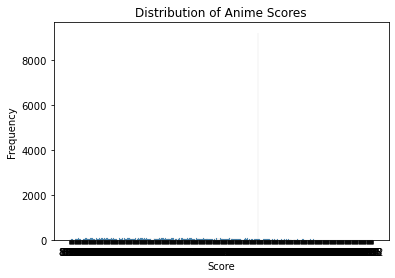

In [ ]:
sns.histplot(df_anime['Score'], bins=2)
plt.title('Distribution of Anime Scores')
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Use plotly for interactive visualizations
fig = px.scatter(df_anime, x='Score', y='Popularity', hover_name='Name', size='Members',
                 color='Type', title='Anime Scores vs. Popularity with Membership Size')
fig.show()

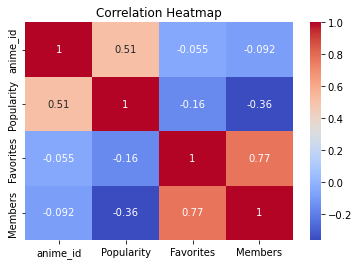

In [ ]:
correlation_matrix = df_anime.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

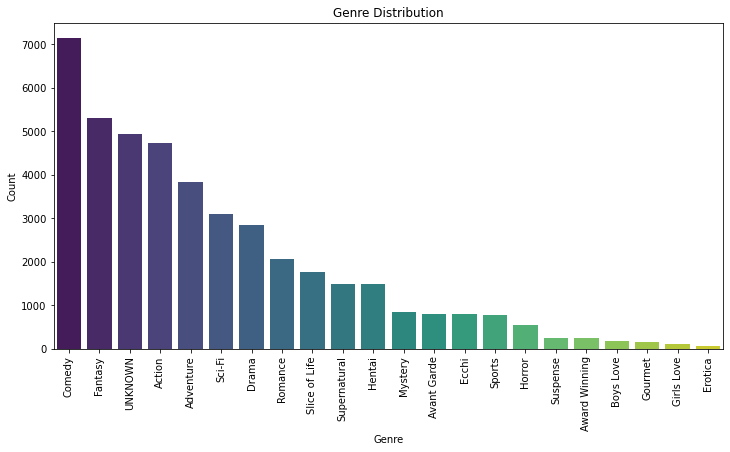

In [ ]:
genre_counts = df_anime['Genres'].str.split(', ').explode().value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(x=genre_counts.index, y=genre_counts.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Genre Distribution')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.show()


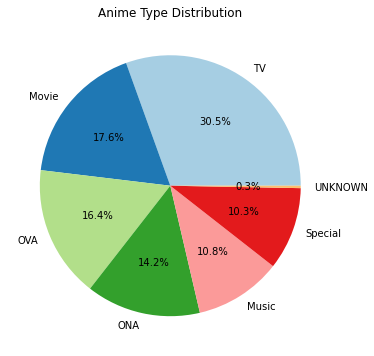

In [ ]:
type_counts = df_anime['Type'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(type_counts, labels=type_counts.index, autopct='%1.1f%%', colors=sns.color_palette('Paired'))
plt.title('Anime Type Distribution')
plt.show()

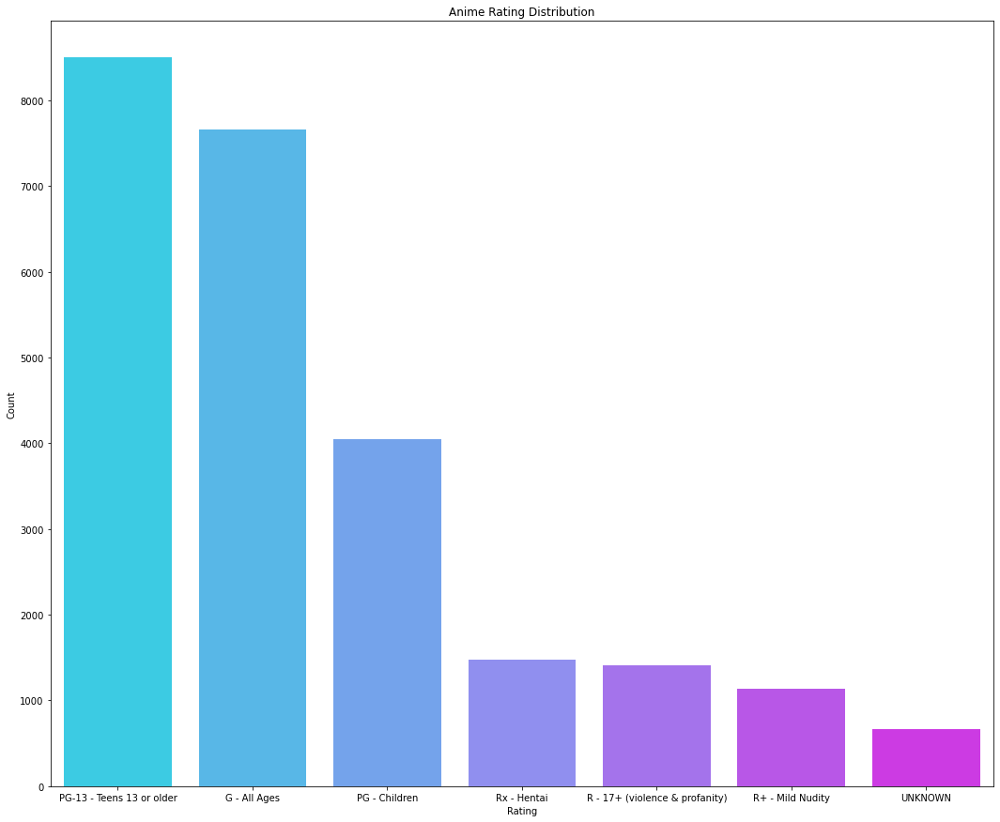

In [ ]:
rating_counts = df_anime['Rating'].value_counts()

plt.figure(figsize=(18, 15))
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='cool')
plt.title('Anime Rating Distribution')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

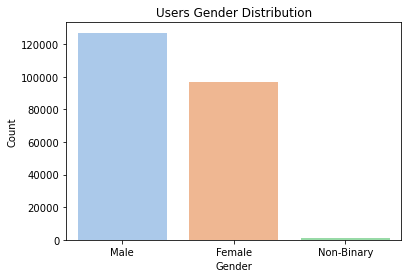

In [ ]:
gender_counts = df_user_details['Gender'].value_counts()

plt.figure(figsize=(6, 4))
sns.barplot(x=gender_counts.index, y=gender_counts.values, palette='pastel')
plt.title('Users Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

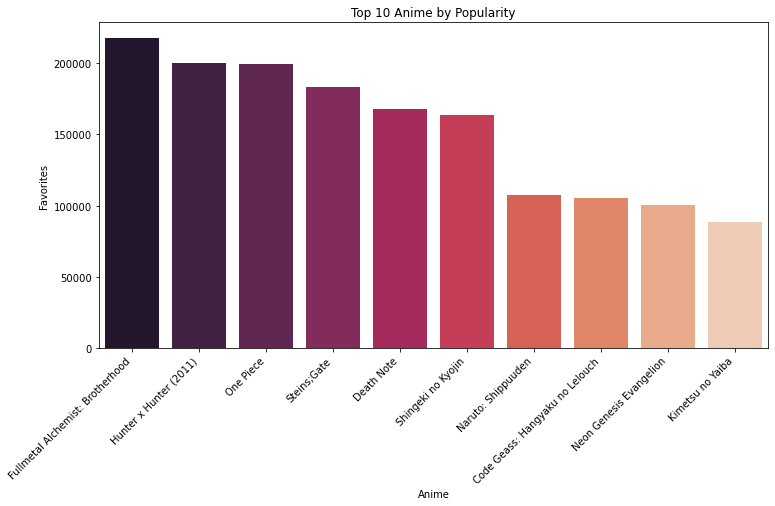

In [ ]:
top_studios = df_anime.nlargest(10, 'Favorites')

plt.figure(figsize=(12, 6))
sns.barplot(x='Name', y='Favorites', data=top_studios, palette='rocket')
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Anime by Popularity')
plt.xlabel('Anime')
plt.ylabel('Favorites')
plt.show()

In [ ]:
anime_user_scores_df = df_anime.merge(df_user_score, on='anime_id', suffixes=('_anime', '_user'))

In [ ]:
combined_df = anime_user_scores_df.merge(df_user_details, left_on='user_id', right_on='Mal ID', suffixes=('_anime', '_user'))

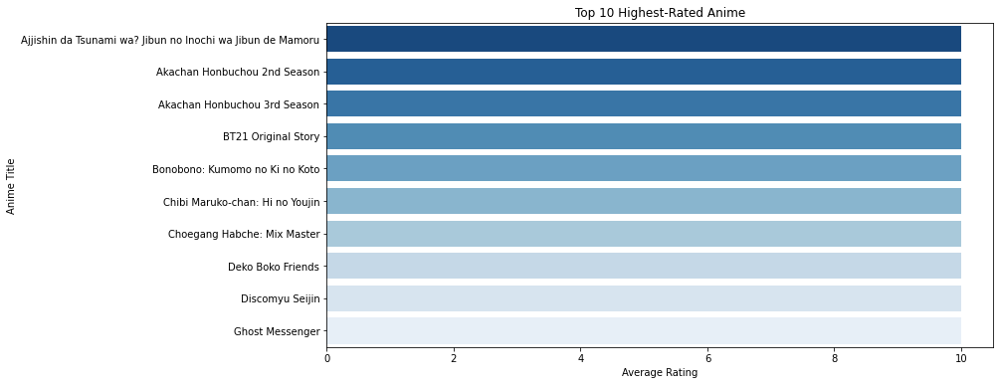

In [ ]:
# Group user scores by anime title and calculate average rating
anime_avg_ratings = combined_df.groupby('Name')['rating'].mean().reset_index()

# Sort by average rating to get the highest-rated anime
top_rated_anime = anime_avg_ratings.nlargest(10, 'rating')

# Plot top 10 highest-rated anime
plt.figure(figsize=(12, 6))
sns.barplot(x='rating', y='Name', data=top_rated_anime, palette='Blues_r')
plt.title('Top 10 Highest-Rated Anime')
plt.xlabel('Average Rating')
plt.ylabel('Anime Title')
plt.show()

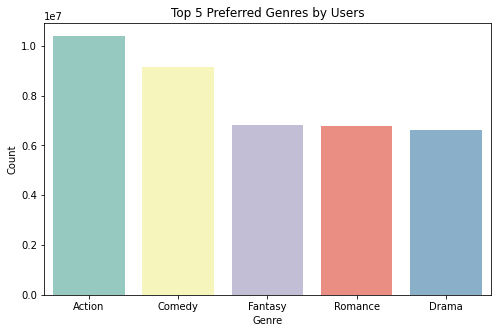

In [ ]:
# Top genres preferred by users
top_genres = combined_df['Genres'].str.split(', ').explode().value_counts().nlargest(5)

plt.figure(figsize=(8, 5))
sns.barplot(x=top_genres.index, y=top_genres.values, palette='Set3')
plt.title('Top 5 Preferred Genres by Users')
plt.xlabel('Genre')
plt.ylabel('Count')
plt.show()

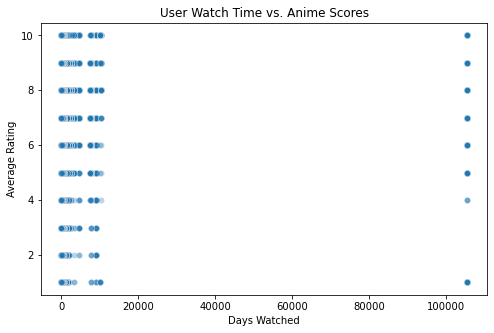

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Days Watched', y='rating', data=combined_df, alpha=0.3)
plt.title('User Watch Time vs. Anime Scores')
plt.xlabel('Days Watched')
plt.ylabel('Average Rating')
plt.show()

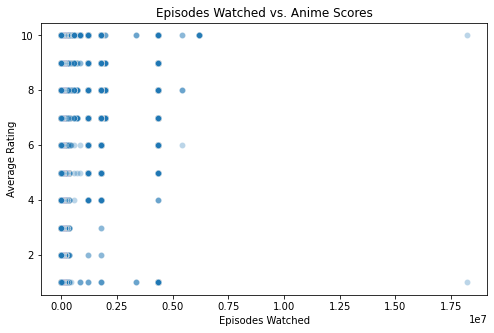

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Episodes Watched', y='rating', data=combined_df, alpha=0.3)
plt.title('Episodes Watched vs. Anime Scores')
plt.xlabel('Episodes Watched')
plt.ylabel('Average Rating')
plt.show()

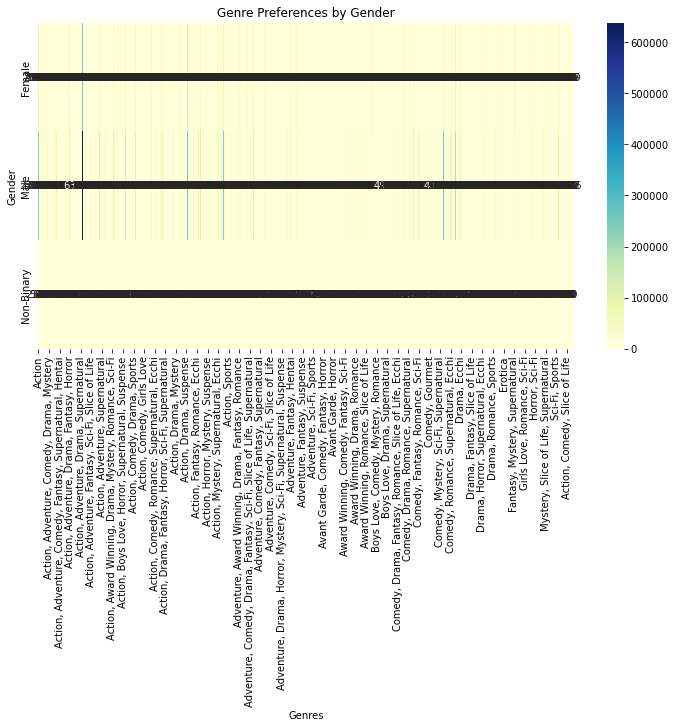

In [ ]:
# Top genres preferred by male and female users
gender_genre_counts = combined_df.groupby(['Gender', 'Genres'])['Genres'].count().unstack().fillna(0)

plt.figure(figsize=(12, 6))
sns.heatmap(gender_genre_counts, cmap='YlGnBu', annot=True, fmt='g')
plt.title('Genre Preferences by Gender')
plt.xlabel('Genres')
plt.ylabel('Gender')
plt.show()

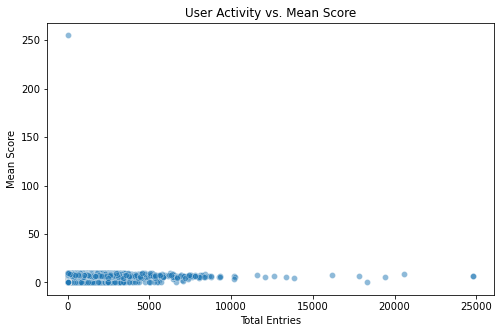

In [ ]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x='Total Entries', y='Mean Score', data=df_user_details, alpha=0.5)
plt.title('User Activity vs. Mean Score')
plt.xlabel('Total Entries')
plt.ylabel('Mean Score')
plt.show()

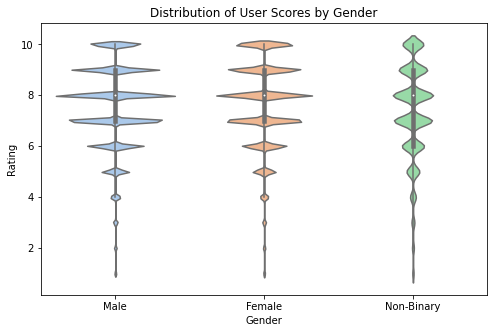

In [ ]:
plt.figure(figsize=(8, 5))
sns.violinplot(x='Gender', y='rating', data=combined_df, palette='pastel')
plt.title('Distribution of User Scores by Gender')
plt.xlabel('Gender')
plt.ylabel('Rating')
plt.show()

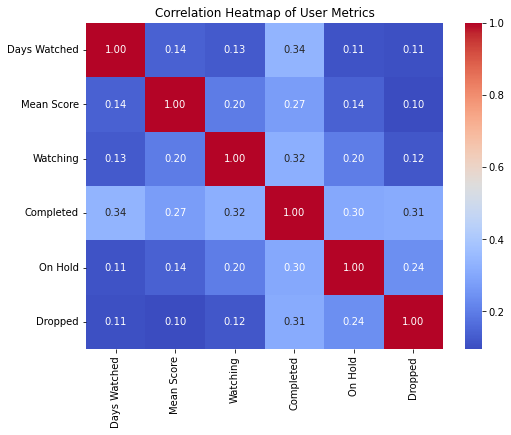

In [ ]:
user_metrics_corr = df_user_details[['Days Watched', 'Mean Score', 'Watching', 'Completed', 'On Hold', 'Dropped']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(user_metrics_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of User Metrics')
plt.show()

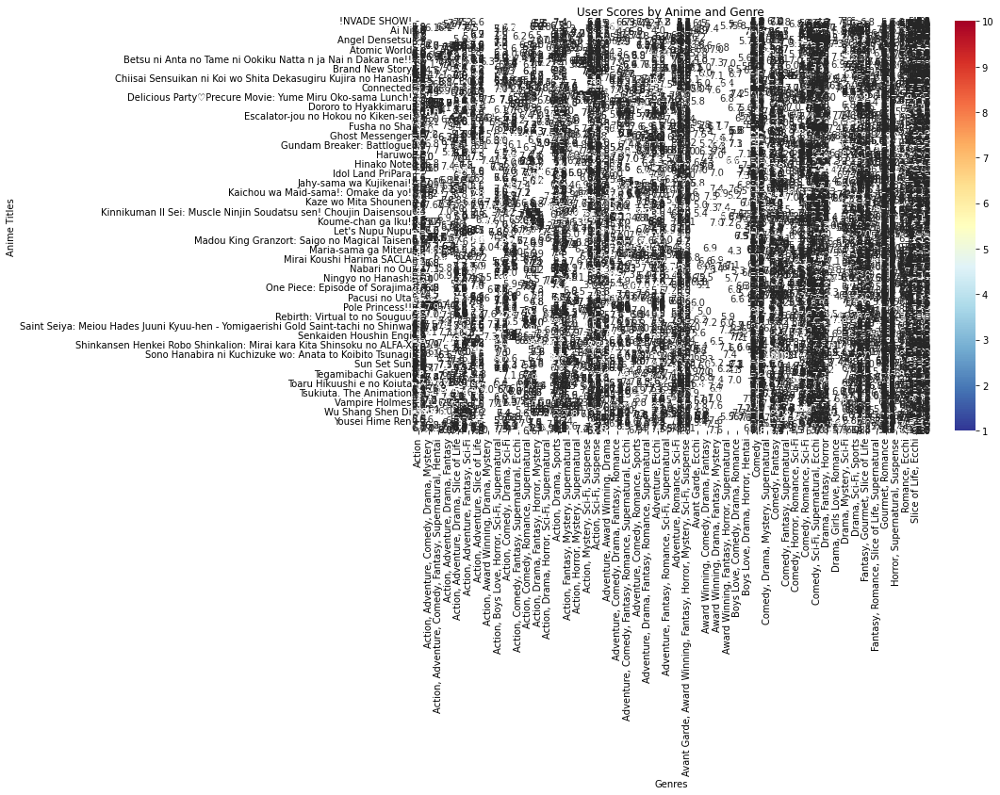

In [ ]:
anime_genre_user_scores = combined_df.pivot_table(index='Name', columns='Genres', values='rating', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(anime_genre_user_scores, cmap='RdYlBu_r', annot=True, fmt='.1f', linewidths=0.5)
plt.title('User Scores by Anime and Genre')
plt.xlabel('Genres')
plt.ylabel('Anime Titles')
plt.show()

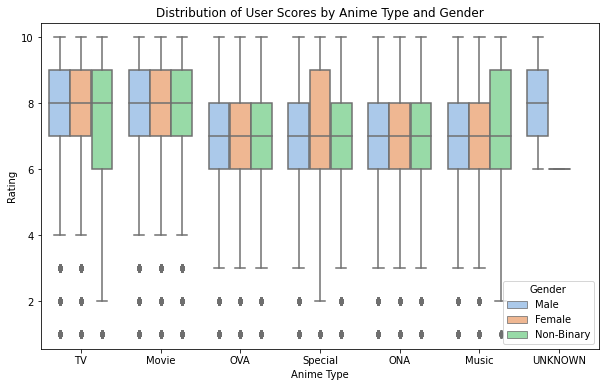

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Type', y='rating', data=combined_df, palette='pastel', hue='Gender')
plt.title('Distribution of User Scores by Anime Type and Gender')
plt.xlabel('Anime Type')
plt.ylabel('Rating')
plt.legend(title='Gender')
plt.show()

<Figure size 864x576 with 0 Axes>

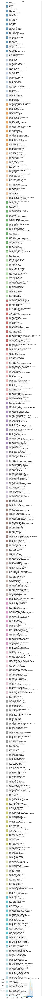

In [ ]:
# df_anime
# Function to extract the start and end years from the "Aired" column
def extract_years(aired_str):
    try:
        start_year = int(aired_str.split()[-1])
        end_year = start_year + 1
        return start_year, end_year
    except ValueError:
        return None, None

# Apply the function to create new columns for start and end years
df_anime['Aired_Start_Year'], df_anime['Aired_End_Year'] = zip(*df_anime['Aired'].apply(extract_years))

# Get the top N genres based on favorites count
top_genres = df_anime['Genres'].str.split(', ').explode().value_counts().nlargest(5)

# Filter the anime data for the top genres
top_genre_anime = df_anime[df_anime['Genres'].apply(lambda x: any(genre in x for genre in top_genres.index))]

# Group the data by year and genre to calculate the total favorites count for each genre by year
genre_popularity_by_year = top_genre_anime.groupby([top_genre_anime['Aired_Start_Year'], 'Genres'])['Favorites'].sum().unstack()

plt.figure(figsize=(12, 8))
genre_popularity_by_year.plot(kind='area', colormap='tab20', alpha=0.7)
plt.title('Top 5 Genres Popularity Trend Over Time')
plt.xlabel('Year')
plt.ylabel('Total Favorites')
# plt.legend(title='Genres')
plt.show()

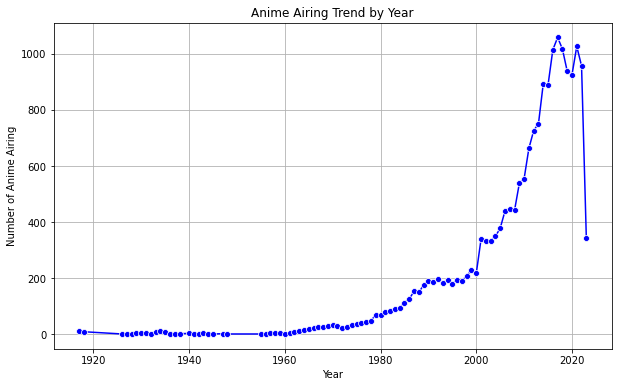

In [ ]:
# df_anime['Aired'] = pd.to_datetime(df_anime['Aired'].str.extract(r'(\w{3}\s\d{1,2},\s\d{4})')[0])

# Extract year from the datetime
df_anime['Year'] = df_anime['Aired'].dt.year

# Group by year to get the count of anime airing in each year
trend_data = df_anime.groupby('Year').size().reset_index(name='Count')

# Create a trend chart
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Count', data=trend_data, marker='o', color='blue')
plt.title('Anime Airing Trend by Year')
plt.xlabel('Year')
plt.ylabel('Number of Anime Airing')
plt.grid(True)
plt.show()

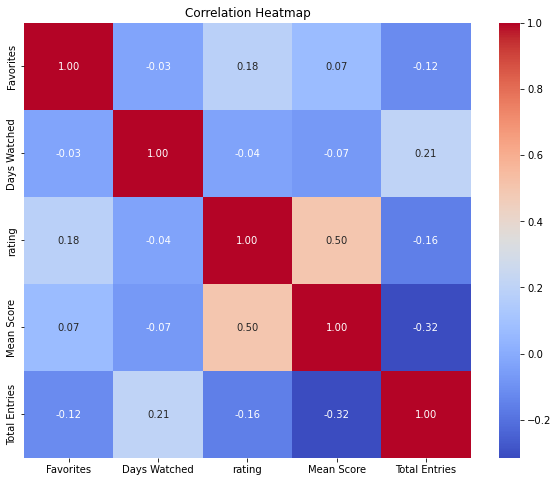

In [ ]:
# Select relevant numerical features for correlation heatmap
numeric_features = combined_df[['Score', 'Episodes', 'Favorites', 'Days Watched', 'rating', 'Mean Score', 'Total Entries']]

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_features.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

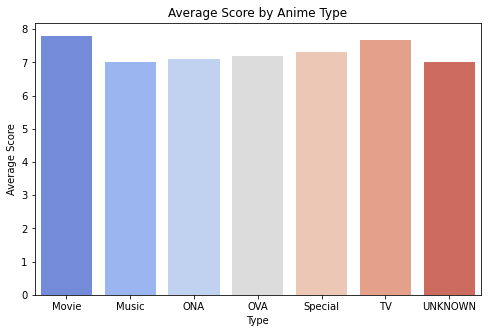

In [ ]:
avg_score_by_type = combined_df.groupby('Type')['rating'].mean()

plt.figure(figsize=(8, 5))
sns.barplot(x=avg_score_by_type.index, y=avg_score_by_type.values, palette='coolwarm')
plt.title('Average Score by Anime Type')
plt.xlabel('Type')
plt.ylabel('Average Score')
plt.show()

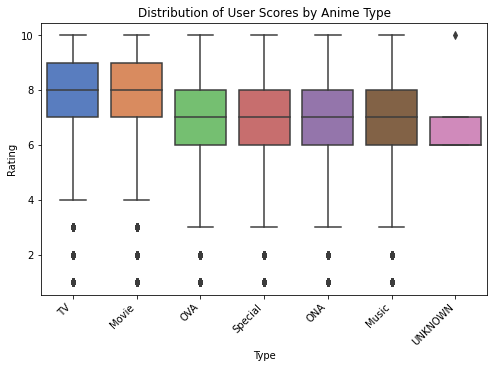

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(x='Type', y='rating', data=combined_df, palette='muted')
plt.title('Distribution of User Scores by Anime Type')
plt.xlabel('Type')
plt.ylabel('Rating')
plt.xticks(rotation=45, ha='right')
plt.show()

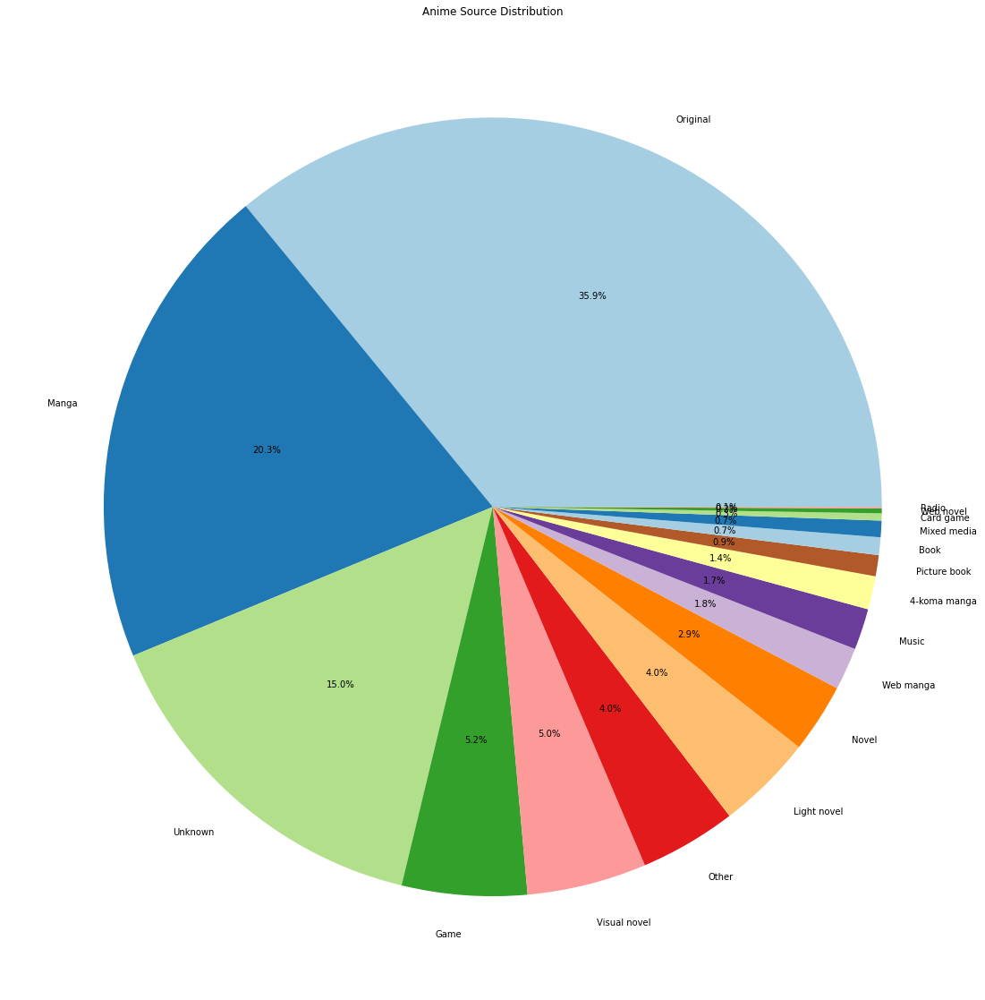

In [ ]:
source_counts = df_anime['Source'].value_counts()

plt.figure(figsize=(20, 20))
plt.pie(source_counts, labels=source_counts.index, autopct='%1.1f%%', colors=sns.color_palette('Paired'))
plt.title('Anime Source Distribution')
plt.show()

In [ ]:
import plotly.graph_objects as go

# Top 10 Anime Genres by Popularity
genre_counts = df_anime['Genres'].str.split(', ').explode().value_counts()
top_genres = genre_counts.nlargest(10)

fig1 = go.Figure()
fig1.add_trace(go.Bar(
    x=top_genres.index,
    y=top_genres.values,
    marker_color='blue',
))
fig1.update_layout(
    title='Top 10 Anime Genres by Popularity',
    xaxis_title='Genre',
    yaxis_title='Number of Anime',
)
fig1.show()

In [ ]:
sliced_data5 = df_user_score[1:2000001]
print(sliced_data5.shape[0])

2000000


In [ ]:
sliced_data5.to_csv('sliced_data.csv', index=False,header = False)

In [ ]:
sliced_data5.head(5)

,user_id,Username,anime_id,Anime Title,rating
1,1,Xinil,48,.hack//Sign,7
2,1,Xinil,320,A Kite,5
3,1,Xinil,49,Aa! Megami-sama!,8
4,1,Xinil,304,Aa! Megami-sama! Movie,8
5,1,Xinil,306,Abenobashi Mahou☆Shoutengai,8


In [ ]:
df_user_details.head(5)

,Mal ID,Username,Gender,Birthday,Location,Joined,Days Watched,Mean Score,Watching,Completed,On Hold,Dropped,Plan to Watch,Total Entries,Rewatched,Episodes Watched
0,1,Xinil,Male,1985-03-04T00:00:00+00:00,California,2004-11-05T00:00:00+00:00,142.3,7.37,1.0,233.0,8.0,93.0,64.0,399.0,60.0,8458.0
1,3,Aokaado,Male,NaN,"Oslo, Norway",2004-11-11T00:00:00+00:00,68.6,7.34,23.0,137.0,99.0,44.0,40.0,343.0,15.0,4072.0
2,4,Crystal,Female,NaN,"Melbourne, Australia",2004-11-13T00:00:00+00:00,212.8,6.68,16.0,636.0,303.0,0.0,45.0,1000.0,10.0,12781.0
3,9,Arcane,NaN,NaN,NaN,2004-12-05T00:00:00+00:00,30.0,7.71,5.0,54.0,4.0,3.0,0.0,66.0,0.0,1817.0
4,18,Mad,NaN,NaN,NaN,2005-01-03T00:00:00+00:00,52.0,6.27,1.0,114.0,10.0,5.0,23.0,153.0,42.0,3038.0


In [ ]:
df_user_score.head(5)

,user_id,Username,anime_id,Anime Title,rating
0,1,Xinil,21,One Piece,9
1,1,Xinil,48,.hack//Sign,7
2,1,Xinil,320,A Kite,5
3,1,Xinil,49,Aa! Megami-sama!,8
4,1,Xinil,304,Aa! Megami-sama! Movie,8


In [ ]:
df_anime.head(3)

,anime_id,Name,English name,Other name,Score,Genres,Synopsis,Type,Episodes,Aired,...,Studios,Source,Duration,Rating,Rank,Popularity,Favorites,Scored By,Members,Image URL
0,1,Cowboy Bebop,Cowboy Bebop,カウボーイビバップ,8.75,"Action, Award Winning, Sci-Fi","Crime is timeless. By the year 2071, humanity ...",TV,26.0,"Apr 3, 1998 to Apr 24, 1999",...,Sunrise,Original,24 min per ep,R - 17+ (violence & profanity),41.0,43,78525,914193.0,1771505,https://cdn.myanimelist.net/images/anime/4/196...
1,5,Cowboy Bebop: Tengoku no Tobira,Cowboy Bebop: The Movie,カウボーイビバップ 天国の扉,8.38,"Action, Sci-Fi","Another day, another bounty—such is the life o...",Movie,1.0,"Sep 1, 2001",...,Bones,Original,1 hr 55 min,R - 17+ (violence & profanity),189.0,602,1448,206248.0,360978,https://cdn.myanimelist.net/images/anime/1439/...
2,6,Trigun,Trigun,トライガン,8.22,"Action, Adventure, Sci-Fi","Vash the Stampede is the man with a $$60,000,0...",TV,26.0,"Apr 1, 1998 to Sep 30, 1998",...,Madhouse,Manga,24 min per ep,PG-13 - Teens 13 or older,328.0,246,15035,356739.0,727252,https://cdn.myanimelist.net/images/anime/7/203...
